In [2]:
import torch, sys, os, random, json, time
import matplotlib.pyplot as plt
import numpy as np

from dataset import *
from scipy.ndimage import zoom
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from neuralop.models import TFNO
from neuralop.utils import count_params
from scipy.io import savemat, loadmat
from tqdm import tqdm

%matplotlib widget

In [3]:
def create_circular_mask(h, w, center=None, radius=None):

    if center is None: # use the middle of the image
        center = (int(w/2)-0.5, int(h/2)-0.5)
    if radius is None: # use the smallest distance between the center and image walls
        radius = min(center[0], center[1], w-center[0], h-center[1])

    Y, X = np.ogrid[:h, :w]
    dist_from_center = np.sqrt((X - center[0])**2 + (Y-center[1])**2)

    mask = dist_from_center <= radius
    return mask

img = np.ones((128,128))
h, w = img.shape[:2]
mask = create_circular_mask(h, w, radius = 40)
masked_img = img.copy()
masked_img[~mask] = 0

In [4]:
mode = 'gpu'
config = 'noise0'
# modes, hc, pc = 32, 32, 32 # 2M
modes, hc, pc = 64, 32, 32 # 7M
# modes, hc, pc = 64, 64, 64 # 30M
model_name = f'tfno_mode{modes}_hc{hc}_pc{pc}'
correlation = 'high'
resolution = 128

if mode=='gpu':
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    # after switch device, you need restart the kernel
    torch.cuda.set_device(1)
    torch.set_default_tensor_type('torch.cuda.FloatTensor')
else:
    device = torch.device('cpu')
    torch.set_default_dtype(torch.float32)

model = TFNO(n_modes=(modes, modes), 
             hidden_channels=hc, 
             projection_channels=pc, 
             factorization='tucker', rank=0.42)
    
output_dir = f'/home/sci/hdai/Projects/UltrasoundTfno/Checkpoints_big/{model_name}_grf{resolution}_{correlation}_{config}'
if not os.path.isdir(output_dir):
    os.mkdir(output_dir)
    
data_path = '/home/sci/hdai/Projects/Datasets/Ultrasound/GRF/mats'

## A. Training

In [7]:
new_split = False
save_model = True
resume = False
n_epochs = 10001
start_epoch_num = 1001
log_test_interval = 500
learning_rate = 1e-3
training_loss_list, testing_loss_list = [], []

training_subset_id_list = random.sample(range(0,200),160)
testing_subset_id_list = [item for item in range(0,200) if item not in training_subset_id_list]

if new_split:
    with open(f'/home/sci/hdai/Projects/UltrasoundTfno/Checkpoints_big/training_subset_id_list.json', "w") as fp:
        json.dump(training_subset_id_list, fp)
    with open(f'/home/sci/hdai/Projects/UltrasoundTfno/Checkpoints_big/testing_subset_id_list.json', "w") as fp:
        json.dump(testing_subset_id_list, fp)
else:
    with open(f'/home/sci/hdai/Projects/UltrasoundTfno/Checkpoints_big/training_subset_id_list.json', "rb") as fp:
        training_subset_id_list = json.load(fp)
    with open(f'/home/sci/hdai/Projects/UltrasoundTfno/Checkpoints_big/testing_subset_id_list.json', "rb") as fp:
        testing_subset_id_list = json.load(fp)

In [5]:
model = model.to(device)
n_params = count_params(model)
print(f'\nOur model has {n_params} parameters.')
print('\n### MODEL ###\n', model)

if resume:
    checkpoint = torch.load(f'{output_dir}/epoch_{start_epoch_num-1}_checkpoints.pth.tar')
    model.load_state_dict(checkpoint['model_state_dict'])
else:
    start_epoch_num = 0
        
training_dataset = PairDataset(data_path, config=config, correlation=correlation, subset_idx_list=training_subset_id_list)
training_dataloader = DataLoader(training_dataset, batch_size=len(training_subset_id_list), shuffle=False, num_workers=0)
print(training_dataset.subset_idx_list)

testing_dataset = PairDataset(data_path, config=config, correlation=correlation, subset_idx_list=testing_subset_id_list)
testing_dataloader = DataLoader(testing_dataset, batch_size=len(testing_subset_id_list), shuffle=False, num_workers=0)
print(testing_dataset.subset_idx_list)

optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, weight_decay=0)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=10)
criterion = torch.nn.MSELoss()


Our model has 7366337 parameters.

### MODEL ###
 TFNO(
  (convs): FactorizedSpectralConv(
    (weight): ModuleList(
      (0): ComplexTuckerTensor(shape=(32, 32, 32, 32), rank=(26, 26, 26, 26))
      (1): ComplexTuckerTensor(shape=(32, 32, 32, 32), rank=(26, 26, 26, 26))
      (2): ComplexTuckerTensor(shape=(32, 32, 32, 32), rank=(26, 26, 26, 26))
      (3): ComplexTuckerTensor(shape=(32, 32, 32, 32), rank=(26, 26, 26, 26))
      (4): ComplexTuckerTensor(shape=(32, 32, 32, 32), rank=(26, 26, 26, 26))
      (5): ComplexTuckerTensor(shape=(32, 32, 32, 32), rank=(26, 26, 26, 26))
      (6): ComplexTuckerTensor(shape=(32, 32, 32, 32), rank=(26, 26, 26, 26))
      (7): ComplexTuckerTensor(shape=(32, 32, 32, 32), rank=(26, 26, 26, 26))
    )
  )
  (fno_skips): ModuleList(
    (0): SoftGating()
    (1): SoftGating()
    (2): SoftGating()
    (3): SoftGating()
  )
  (lifting): Lifting(
    (fc): Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1))
  )
  (projection): Projection(
    (fc1): Conv2

In [6]:
model.train()

for epoch in tqdm(range(start_epoch_num, start_epoch_num+n_epochs)):
    epoch_loss = 0
    for i, sample in enumerate(training_dataloader):
        x, y_true = sample['input'].to(device), sample['output'].to(device)
        y_pred = model(x)
        optimizer.zero_grad(set_to_none=True)
        training_loss = criterion(y_pred, y_true)
        
        training_loss.backward()
        optimizer.step()
        epoch_loss += training_loss.item()
        
    with torch.no_grad():
        for i, sample in enumerate(testing_dataloader):
            x, y_true = sample['input'].to(device), sample['output'].to(device)
            y_pred = model(x)
        testing_loss = criterion(y_pred, y_true)
    
    training_loss_list.append(epoch_loss)
    testing_loss_list.append(testing_loss.item())
    scheduler.step(epoch_loss)

    if epoch%log_test_interval==0: 
        print(f'epoch {epoch} MSELoss: {epoch_loss}')
        if save_model:
            torch.save({
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': epoch_loss,
            }, f'{output_dir}/epoch_{epoch}_checkpoints.pth.tar')
            
with open(f'{output_dir}/training_loss.json', "w") as fp:
    json.dump(training_loss_list, fp)
with open(f'{output_dir}/testing_loss.json', "w") as fp:
    json.dump(testing_loss_list, fp)

  0%|                                                                                                                               | 0/10001 [00:00<?, ?it/s]

epoch 0 MSELoss: 0.145424485206604


  5%|█████▊                                                                                                               | 500/10001 [01:29<27:51,  5.68it/s]

epoch 500 MSELoss: 0.013888063840568066


 10%|███████████▌                                                                                                        | 1000/10001 [02:58<26:27,  5.67it/s]

epoch 1000 MSELoss: 0.008209828287363052


 15%|█████████████████▍                                                                                                  | 1500/10001 [04:26<24:45,  5.72it/s]

epoch 1500 MSELoss: 0.00643341988325119


 20%|███████████████████████▏                                                                                            | 2000/10001 [05:54<23:25,  5.69it/s]

epoch 2000 MSELoss: 0.005465452093631029


 25%|████████████████████████████▉                                                                                       | 2500/10001 [07:22<21:55,  5.70it/s]

epoch 2500 MSELoss: 0.004997328855097294


 30%|██████████████████████████████████▊                                                                                 | 3000/10001 [08:51<20:22,  5.73it/s]

epoch 3000 MSELoss: 0.004672129172831774


 35%|████████████████████████████████████████▌                                                                           | 3500/10001 [10:19<18:54,  5.73it/s]

epoch 3500 MSELoss: 0.004518299829214811


 40%|██████████████████████████████████████████████▍                                                                     | 4000/10001 [11:47<17:27,  5.73it/s]

epoch 4000 MSELoss: 0.004372721072286367


 45%|████████████████████████████████████████████████████▏                                                               | 4500/10001 [13:14<15:56,  5.75it/s]

epoch 4500 MSELoss: 0.004244279582053423


 50%|█████████████████████████████████████████████████████████▉                                                          | 5000/10001 [14:42<14:31,  5.74it/s]

epoch 5000 MSELoss: 0.004214119166135788


 55%|███████████████████████████████████████████████████████████████▊                                                    | 5500/10001 [16:10<13:04,  5.73it/s]

epoch 5500 MSELoss: 0.004178313538432121


 60%|█████████████████████████████████████████████████████████████████████▌                                              | 6000/10001 [17:38<11:35,  5.75it/s]

epoch 6000 MSELoss: 0.00413780240342021


 65%|███████████████████████████████████████████████████████████████████████████▍                                        | 6500/10001 [19:05<10:08,  5.76it/s]

epoch 6500 MSELoss: 0.004093057010322809


 70%|█████████████████████████████████████████████████████████████████████████████████▏                                  | 7000/10001 [20:33<08:44,  5.72it/s]

epoch 7000 MSELoss: 0.004043671302497387


 75%|██████████████████████████████████████████████████████████████████████████████████████▉                             | 7500/10001 [22:01<07:15,  5.74it/s]

epoch 7500 MSELoss: 0.003993510734289885


 80%|████████████████████████████████████████████████████████████████████████████████████████████▊                       | 8000/10001 [23:29<05:47,  5.75it/s]

epoch 8000 MSELoss: 0.003950245212763548


 85%|██████████████████████████████████████████████████████████████████████████████████████████████████▌                 | 8500/10001 [24:56<04:21,  5.74it/s]

epoch 8500 MSELoss: 0.003927239216864109


 90%|████████████████████████████████████████████████████████████████████████████████████████████████████████▍           | 9000/10001 [26:24<02:53,  5.78it/s]

epoch 9000 MSELoss: 0.003901636926457286


 95%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▏     | 9500/10001 [27:52<01:26,  5.76it/s]

epoch 9500 MSELoss: 0.003873191773891449


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉| 10000/10001 [29:19<00:00,  5.74it/s]

epoch 10000 MSELoss: 0.0038449950516223907


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10001/10001 [29:20<00:00,  5.68it/s]


## B. Inference

In [5]:
epoch = 10000
checkpoint = torch.load(f'{output_dir}/epoch_{epoch}_checkpoints.pth.tar')
model.load_state_dict(checkpoint['model_state_dict'])
model = model.to(device)

### B.1 Loss trend

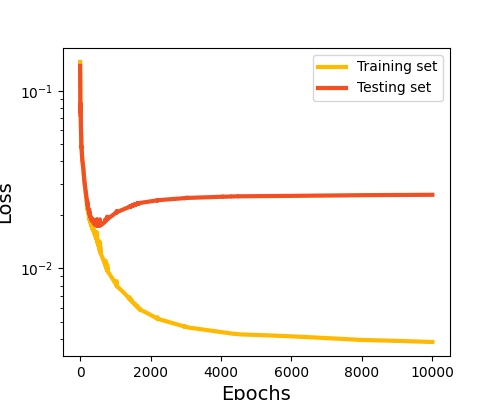

In [8]:
plt.figure(figsize=(5,4))
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.plot(training_loss_list,color='#ffb901',linewidth=3,label='Training set')
plt.plot(testing_loss_list,color='#f25022',linewidth=3,label='Testing set')
plt.yscale('log')
plt.legend()

plt.savefig(f'{output_dir}/{model_name}_loss_trend_{correlation}_{config}.pdf', bbox_inches='tight', dpi=300)

### B.2 Test samples

1.439967393875122


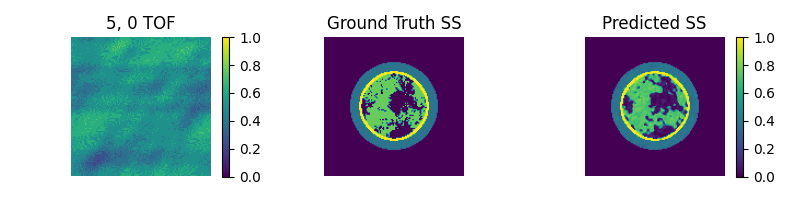

In [8]:
out_list = []
sample_num = 40

testing_dataset = PairDataset(data_path, config=config, correlation=correlation, subset_idx_list=testing_subset_id_list)
testing_dataloader = DataLoader(testing_dataset, batch_size=len(testing_subset_id_list), shuffle=False, num_workers=0)
test_samples = testing_dataloader.dataset

fig = plt.figure(figsize=(8, sample_num*2))
    
for index in range(sample_num):
    data = test_samples[index]
    x = data['input'].to(device)
    y = data['output'].to(device)
    abs_id = data['abs_id']
    rel_id = data['rel_id']
#     st = time.time()
    out = model(x.unsqueeze(0))
#     et = time.time()
#     print(et-st)

    ax1 = fig.add_subplot(sample_num, 3, index*3 + 1)
    im1 = ax1.imshow(x[0].to('cpu'), cmap='viridis', vmin=0, vmax=1)
    ax1.set_title(f'{abs_id}, {rel_id} TOF')
    plt.colorbar(im1, ax=ax1)
    plt.axis('off')

    ax2 = fig.add_subplot(sample_num, 3, index*3 + 2)
    im2 = ax2.imshow(y.to('cpu').squeeze()*masked_img, cmap='viridis', vmin=0, vmax=1)
    if index == 0: 
        ax2.set_title('Ground Truth SS')
    plt.axis('off')

    ax3 = fig.add_subplot(sample_num, 3, index*3 + 3)
    im3 = ax3.imshow(out.to('cpu').squeeze().detach().numpy()*masked_img, cmap='viridis', vmin=0, vmax=1)
    out_list.append(out.to('cpu').squeeze().detach().numpy())
    if index == 0: 
        ax3.set_title('Predicted SS')
    plt.colorbar(im3, ax=ax3)
    plt.axis('off')

plt.tight_layout()
plt.savefig(f'{output_dir}/{model_name}_test_{epoch}_{correlation}_{config}.pdf', dpi=300)

### B.3 Train samples

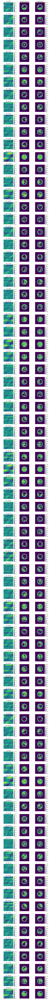

In [10]:
out_list = []
sample_num = 80

training_dataset = PairDataset(data_path, config=config, correlation=correlation, subset_idx_list=training_subset_id_list)
training_dataloader = DataLoader(training_dataset, batch_size=len(training_subset_id_list), shuffle=False, num_workers=0)
train_samples = training_dataloader.dataset

fig = plt.figure(figsize=(8, sample_num*2))
    
for index in range(sample_num):
    data = train_samples[index]
    x = data['input'].to(device)
    y = data['output'].to(device)
    abs_id = data['abs_id']
    rel_id = data['rel_id']
    out = model(x.unsqueeze(0))

    ax1 = fig.add_subplot(sample_num, 3, index*3 + 1)
    im1 = ax1.imshow(x[0].to('cpu'), cmap='viridis', vmin=0, vmax=1)
#     if index == 0: 
    ax1.set_title(f'{abs_id}, {rel_id} TOF')
    plt.colorbar(im1, ax=ax1)
    plt.axis('off')

    ax2 = fig.add_subplot(sample_num, 3, index*3 + 2)
    im2 = ax2.imshow(y.to('cpu').squeeze()*masked_img, cmap='viridis', vmin=0, vmax=1)
    if index == 0: 
        ax2.set_title('Ground Truth SS')
    plt.axis('off')

    ax3 = fig.add_subplot(sample_num, 3, index*3 + 3)
    im3 = ax3.imshow(out.to('cpu').squeeze().detach().numpy()*masked_img, cmap='viridis', vmin=0, vmax=1)
    out_list.append(out.to('cpu').squeeze().detach().numpy())
    if index == 0: 
        ax3.set_title('Predicted SS')
    plt.colorbar(im3, ax=ax3)
    plt.axis('off')

plt.tight_layout()
plt.savefig(f'{output_dir}/{model_name}_train_{epoch}_{correlation}_{config}.pdf', dpi=300)

### B.4 Final train/test MSE

In [11]:
with torch.no_grad():
    for i, sample in enumerate(training_dataloader):
        x, y_true = sample['input'].to(device), sample['output'].to(device)
        y_pred = model(x)

stacked_mask = torch.stack([torch.from_numpy(masked_img).to(device)]*160,dim=0)
y_true_masked = y_true.squeeze()*stacked_mask
y_pred_masked = y_pred.squeeze()*stacked_mask

mse_array = torch.sum(((y_true_masked-y_pred_masked))**2, (1, 2))/(resolution**2)
l2 = np.linalg.norm(y_true_masked.cpu().numpy().flatten()-y_pred_masked.cpu().numpy().flatten(),2)/np.linalg.norm(y_true_masked.cpu().numpy().flatten(),2)
with open(f'{output_dir}/final_train_mse.json', "w") as fp:
    json.dump({'mse_mean':torch.mean(mse_array).item(), 'mse_std':torch.std(mse_array).item(), 'l2_rel_error': l2}, fp)
print({'mse_mean':torch.mean(mse_array).item(), 'mse_std':torch.std(mse_array).item(), 'l2_rel_error': l2})

RuntimeError: The size of tensor a (80) must match the size of tensor b (160) at non-singleton dimension 0

In [ ]:
with torch.no_grad():
    for i, sample in enumerate(testing_dataloader):
        x, y_true = sample['input'].to(device), sample['output'].to(device)
        y_pred = model(x)
        
stacked_mask = torch.stack([torch.from_numpy(masked_img).to(device)]*40,dim=0)
y_true_masked = y_true.squeeze()*stacked_mask
y_pred_masked = y_pred.squeeze()*stacked_mask

mse_array = torch.sum(((y_true_masked-y_pred_masked))**2, (1, 2))/(resolution**2)
l2 = np.linalg.norm(y_true_masked.cpu().numpy().flatten()-y_pred_masked.cpu().numpy().flatten(),2)/np.linalg.norm(y_true_masked.cpu().numpy().flatten(),2)

with open(f'{output_dir}/final_test_mse.json', "w") as fp:
    json.dump({'mse_mean':torch.mean(mse_array).item(), 'mse_std':torch.std(mse_array).item(), 'l2_rel_error': l2}, fp)
print({'mse_mean':torch.mean(mse_array).item(), 'mse_std':torch.std(mse_array).item(), 'l2_rel_error': l2})